In [3]:
import pandas as pd
import numpy as np

# TASK 1

In [4]:
df=pd.read_csv('music.csv')
df

,Index,Title,Artist,Top Genre,Year,Beats Per Minute (BPM),Energy,Danceability,Loudness (dB),Liveness,Valence,Length (Duration),Acousticness,Speechiness,Popularity
0,1,Sunrise,Norah Jones,adult standards,2004,157,30,53,-14,11,68,201,94,3,71
1,2,Black Night,Deep Purple,album rock,2000,135,79,50,-11,17,81,207,17,7,39
2,3,Clint Eastwood,Gorillaz,alternative hip hop,2001,168,69,66,-9,7,52,341,2,17,69
3,4,The Pretender,Foo Fighters,alternative metal,2007,173,96,43,-4,3,37,269,0,4,76
4,5,Waitin' On A Sunny Day,Bruce Springsteen,classic rock,2002,106,82,58,-5,10,87,256,1,3,59
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,1990,Heartbreak Hotel,Elvis Presley,adult standards,1958,94,21,70,-12,11,72,128,84,7,63
1990,1991,Hound Dog,Elvis Presley,adult standards,1958,175,76,36,-8,76,95,136,73,6,69
1991,1992,Johnny B. Goode,Chuck Berry,blues rock,1959,168,80,53,-9,31,97,162,74,7,74
1992,1993,Take Five,The Dave Brubeck Quartet,bebop,1959,174,26,45,-13,7,60,324,54,4,65


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1994 entries, 0 to 1993
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Index                   1994 non-null   int64 
 1   Title                   1994 non-null   object
 2   Artist                  1994 non-null   object
 3   Top Genre               1994 non-null   object
 4   Year                    1994 non-null   int64 
 5   Beats Per Minute (BPM)  1994 non-null   int64 
 6   Energy                  1994 non-null   int64 
 7   Danceability            1994 non-null   int64 
 8   Loudness (dB)           1994 non-null   int64 
 9   Liveness                1994 non-null   int64 
 10  Valence                 1994 non-null   int64 
 11  Length (Duration)       1994 non-null   int64 
 12  Acousticness            1994 non-null   int64 
 13  Speechiness             1994 non-null   int64 
 14  Popularity              1994 non-null   int64 
dtypes: i

In [6]:
catagory=df.iloc[:,:5]
catagory

,Index,Title,Artist,Top Genre,Year
0,1,Sunrise,Norah Jones,adult standards,2004
1,2,Black Night,Deep Purple,album rock,2000
2,3,Clint Eastwood,Gorillaz,alternative hip hop,2001
3,4,The Pretender,Foo Fighters,alternative metal,2007
4,5,Waitin' On A Sunny Day,Bruce Springsteen,classic rock,2002
...,...,...,...,...,...
1989,1990,Heartbreak Hotel,Elvis Presley,adult standards,1958
1990,1991,Hound Dog,Elvis Presley,adult standards,1958
1991,1992,Johnny B. Goode,Chuck Berry,blues rock,1959
1992,1993,Take Five,The Dave Brubeck Quartet,bebop,1959


In [7]:
from sklearn.preprocessing import StandardScaler
df1=pd.DataFrame(StandardScaler().fit_transform(df.iloc[:,5:]),columns=list(df.columns)[5:])
df1

,Beats Per Minute (BPM),Energy,Danceability,Loudness (dB),Liveness,Valence,Length (Duration),Acousticness,Speechiness,Popularity
0,1.312739,-1.340009,-0.015521,-1.368667,-0.479098,0.748080,-0.656580,2.245908,-0.453358,0.799653
1,0.527616,0.872304,-0.210991,-0.546064,-0.120314,1.271177,-0.592464,-0.408833,0.455637,-1.430623
2,1.705301,0.420812,0.831514,0.002338,-0.718286,0.104268,0.839452,-0.925990,2.728126,0.660261
3,1.883738,1.639841,-0.667086,1.373342,-0.957475,-0.499305,0.070064,-0.994944,-0.226109,1.148133
4,-0.507320,1.007752,0.310261,1.099141,-0.538895,1.512607,-0.068853,-0.960467,-0.453358,-0.036701
...,...,...,...,...,...,...,...,...,...,...
1989,-0.935569,-1.746352,1.092140,-0.820265,-0.479098,0.909033,-1.436653,1.901137,0.455637,0.242084
1990,1.955113,0.736856,-1.123182,0.276539,3.407722,1.834513,-1.351166,1.521888,0.228389,0.660261
1991,1.705301,0.917453,-0.015521,0.002338,0.716847,1.914989,-1.073331,1.556365,0.455637,1.008741
1992,1.919426,-1.520606,-0.536773,-1.094466,-0.718286,0.426174,0.657791,0.866822,-0.226109,0.381476


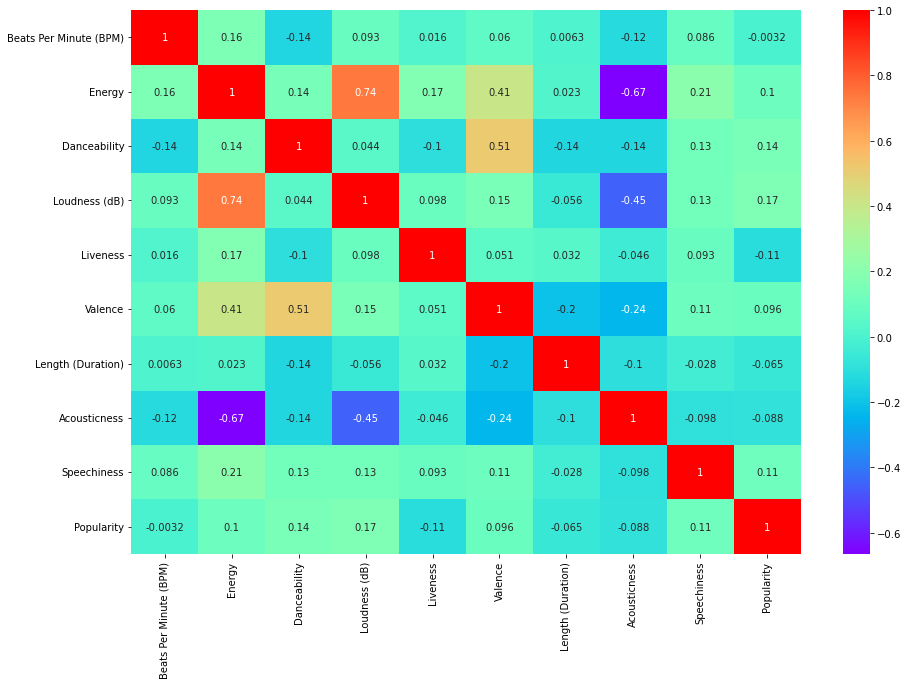

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt
fig,ax = plt.subplots(figsize=(15,10))
sns.heatmap(df1.corr(),annot=True,cmap='rainbow')
plt.show()

In [9]:
name=[]
corr=[]
corr1=[]
for x in range(1,len(df1.corr())):
    for y in range(x):
        name.append([df1.corr().index[x],list(df1.corr().columns)[y]])
        corr.append(round(df1.corr().iloc[x,y],2))
        corr1.append(np.sqrt((round(df1.corr().iloc[x,y],2)**2)))

In [10]:
selection=pd.DataFrame([name,corr,corr1]).T
selection.columns=['name','correlation','correlation1']
selection

,name,correlation,correlation1
0,"[Energy, Beats Per Minute (BPM)]",0.16,0.16
1,"[Danceability, Beats Per Minute (BPM)]",-0.14,0.14
2,"[Danceability, Energy]",0.14,0.14
3,"[Loudness (dB), Beats Per Minute (BPM)]",0.09,0.09
4,"[Loudness (dB), Energy]",0.74,0.74
5,"[Loudness (dB), Danceability]",0.04,0.04
6,"[Liveness, Beats Per Minute (BPM)]",0.02,0.02
7,"[Liveness, Energy]",0.17,0.17
8,"[Liveness, Danceability]",-0.1,0.1
9,"[Liveness, Loudness (dB)]",0.1,0.1


In [11]:
Name=selection.sort_values(by='correlation',ascending=False).head()
Name.index=range(5)
Name

,name,correlation,correlation1
0,"[Loudness (dB), Energy]",0.74,0.74
1,"[Valence, Danceability]",0.51,0.51
2,"[Valence, Energy]",0.41,0.41
3,"[Speechiness, Energy]",0.21,0.21
4,"[Popularity, Loudness (dB)]",0.17,0.17


In [12]:
def recommend(d):
    user=input('Enter the title or artist or genre: ')
    print(d.iloc[:,1:4][(d['Title']==user)|(d['Artist']==user)|(d['Top Genre']==user)])
    index=int(input('Enter the index'))
    print(d.iloc[:,1:5][(d["['Loudness (dB)', 'Energy']"]==(d["['Loudness (dB)', 'Energy']"].iloc[index])) & (d["['Valence', 'Danceability']"]==(d["['Valence', 'Danceability']"].iloc[index])) & (d["['Valence', 'Energy']"]==(d["['Valence', 'Energy']"].loc[index])) & (d["['Speechiness', 'Energy']"]==(d["['Speechiness', 'Energy']"].loc[index])) & (d["['Popularity', 'Loudness (dB)']"]==(d["['Popularity', 'Loudness (dB)']"].loc[index]))])

# TASK 2

no. of cluster: 2 ,distortion: 16329.665709617631 ,silhouette avg: 0.18505769221992843
no. of cluster: 3 ,distortion: 14837.837488005625 ,silhouette avg: 0.14596840828369478
no. of cluster: 4 ,distortion: 13647.559001877402 ,silhouette avg: 0.14941453083184908
no. of cluster: 5 ,distortion: 12593.599207565316 ,silhouette avg: 0.16049979214598395
no. of cluster: 6 ,distortion: 11873.168459437424 ,silhouette avg: 0.161908509450692
no. of cluster: 7 ,distortion: 11249.687071391818 ,silhouette avg: 0.14432256711010918
no. of cluster: 8 ,distortion: 10690.77618558307 ,silhouette avg: 0.13381293622114818
no. of cluster: 9 ,distortion: 10263.522744153735 ,silhouette avg: 0.12787651950361553


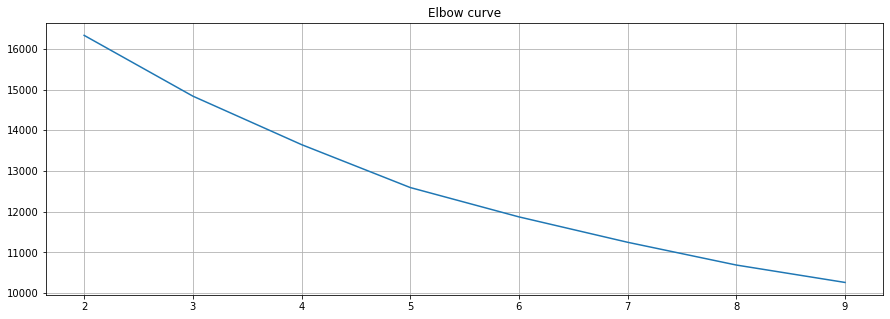

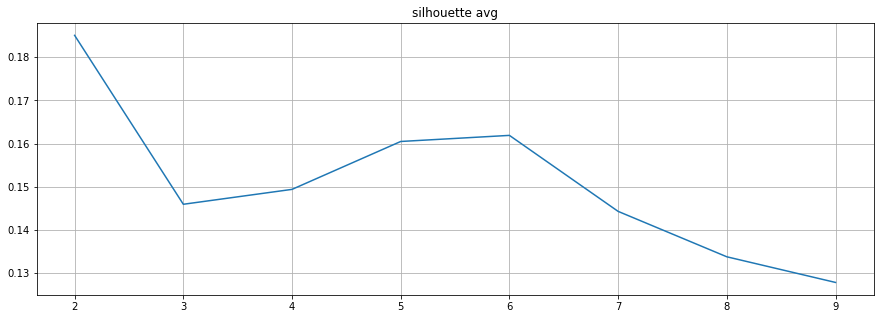

In [13]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
data=[]
dist=[]
for k in range(2,10):
    kmeans=KMeans(n_clusters=k,random_state=2)
    cluster=kmeans.fit(df1)
    distorion=kmeans.inertia_
    cluster_label=cluster.predict(df1)
    silhouette_avg = silhouette_score(df1, cluster_label)
    dist.append(distorion)
    data.append(silhouette_avg)
    print('no. of cluster:',k,',distortion:',distorion,',silhouette avg:',silhouette_avg)
fig = plt.figure(figsize=(15, 5))
plt.plot(range(2, 10), dist)
plt.grid(True)
plt.title('Elbow curve')
plt.show()
fig = plt.figure(figsize=(15, 5))
plt.plot(range(2, 10), data)
plt.grid(True)
plt.title('silhouette avg')
plt.show()

In [14]:
temp=pd.DataFrame([data,range(2,10)])
value=temp.T
value.columns=['score','k']
value['k']=value['k'].astype(int)
score=value.sort_values(by='score').iloc[-2,1]
value

,score,k
0,0.185058,2
1,0.145968,3
2,0.149415,4
3,0.160500,5
4,0.161909,6
5,0.144323,7
6,0.133813,8
7,0.127877,9


[1 3 3 ... 3 1 2]
[[ 0.64560186  0.30668452]
 [-1.0779476  -1.07033717]
 [ 0.03905408 -0.73570345]
 [-0.3839964   0.34363975]
 [-2.311823   -1.78332756]
 [ 0.98122351  1.21696201]]
Attributes used for cluster model:  ['Loudness (dB)', 'Energy']


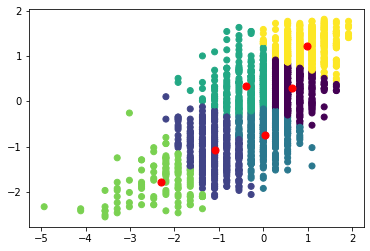

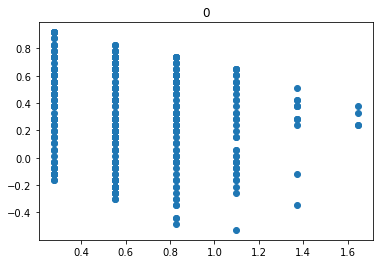

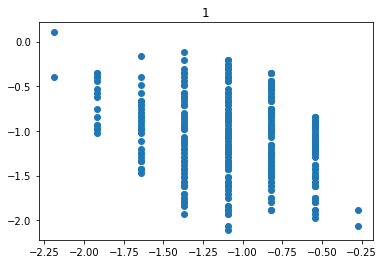

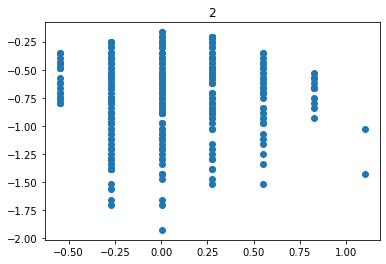

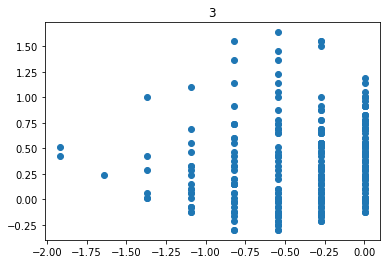

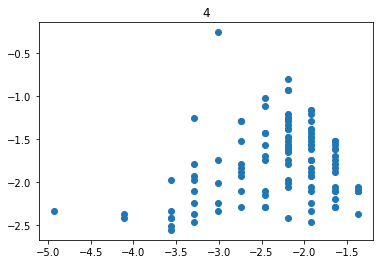

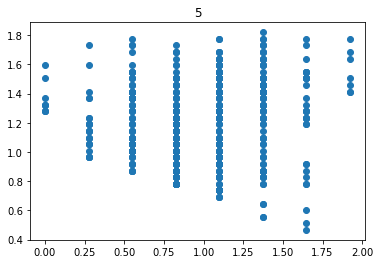

[3 3 0 ... 3 1 3]
[[-0.16368765  0.81200813]
 [ 0.30805921 -0.525792  ]
 [-0.92338936 -1.41913189]
 [ 1.17778356  0.45704867]
 [-1.03196902 -0.14759096]
 [ 1.33134136  1.61903044]]
Attributes used for cluster model:  ['Valence', 'Danceability']


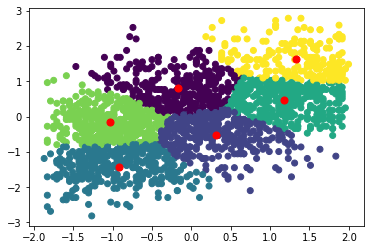

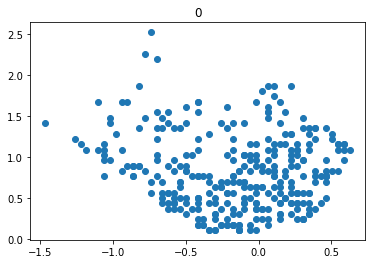

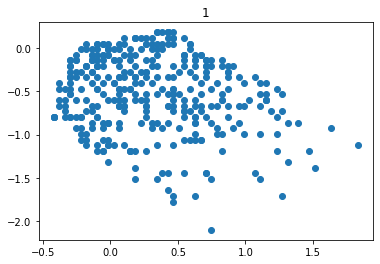

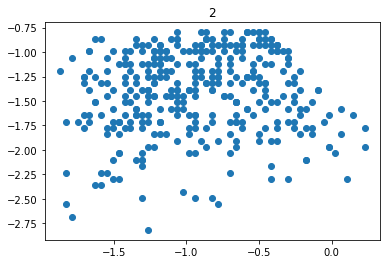

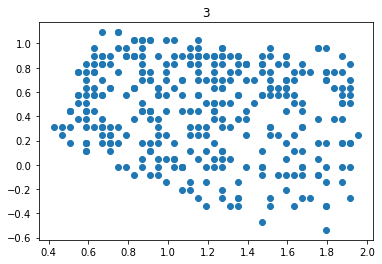

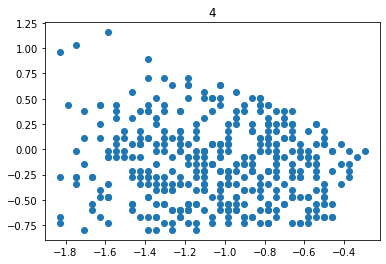

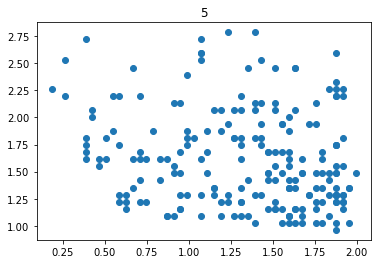

[0 2 5 ... 2 0 0]
[[ 0.68544271 -0.62138325]
 [-0.80339921 -0.30699402]
 [ 1.44314537  0.79978796]
 [-1.00245252 -1.46344193]
 [-0.76638673  1.05892108]
 [ 0.33187971  0.77890481]]
Attributes used for cluster model:  ['Valence', 'Energy']


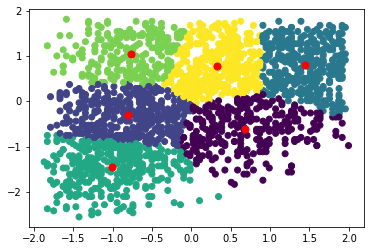

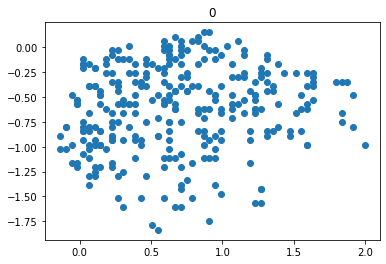

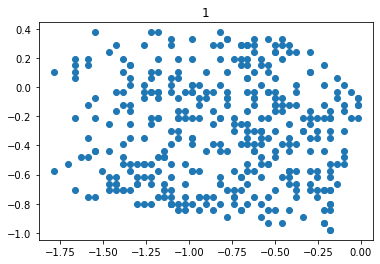

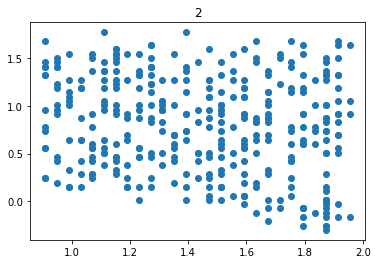

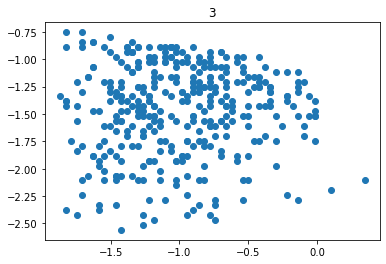

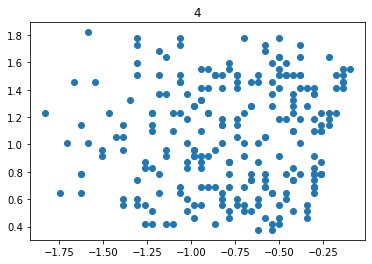

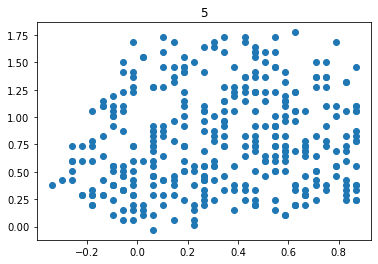

[2 3 1 ... 3 2 5]
[[-0.26100664  0.30533867]
 [ 1.81913053  0.70873072]
 [-0.3072695  -1.56407234]
 [-0.0439183   1.18319178]
 [ 5.888951    0.45638391]
 [-0.30470317 -0.62038687]]
Attributes used for cluster model:  ['Speechiness', 'Energy']


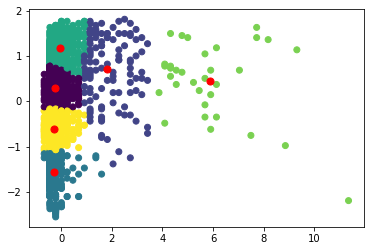

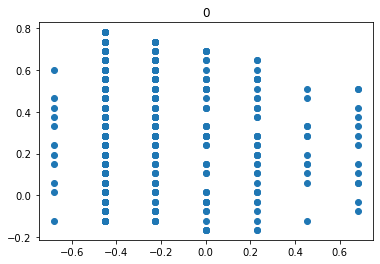

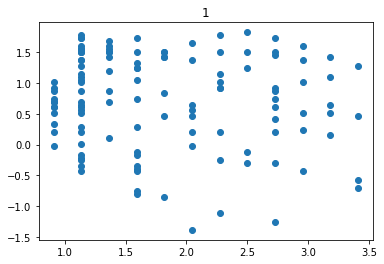

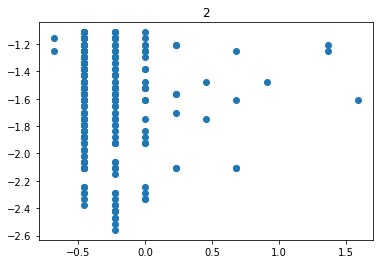

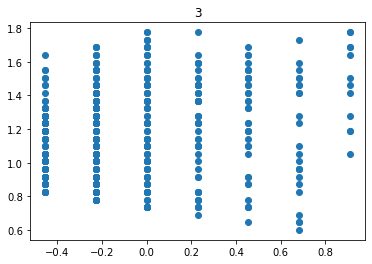

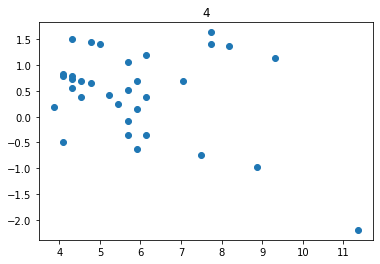

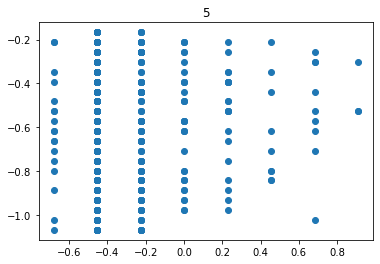

[2 5 2 ... 2 2 1]
[[-1.67205829  0.47070953]
 [-0.32121349  0.54823533]
 [ 0.66337902 -0.50005715]
 [ 0.92078471  0.87210286]
 [ 0.06994853 -2.11029711]
 [-1.10435625 -0.94261744]]
Attributes used for cluster model:  ['Popularity', 'Loudness (dB)']


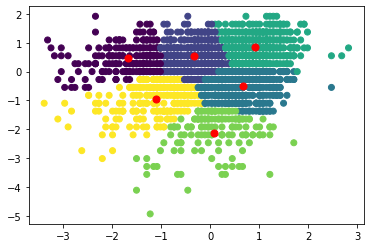

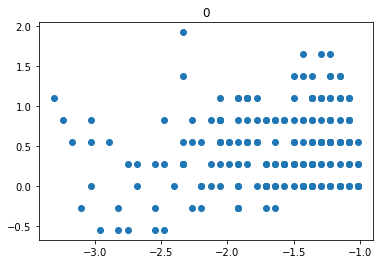

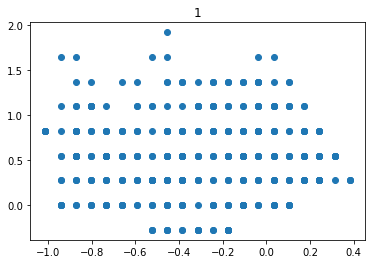

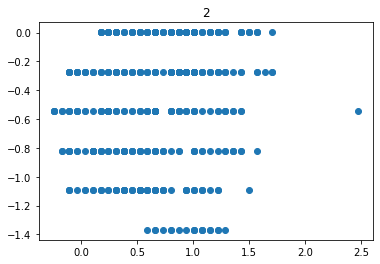

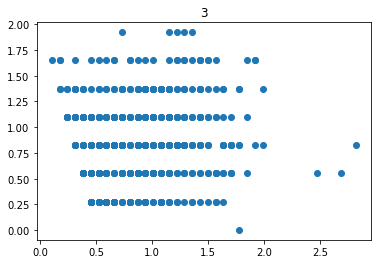

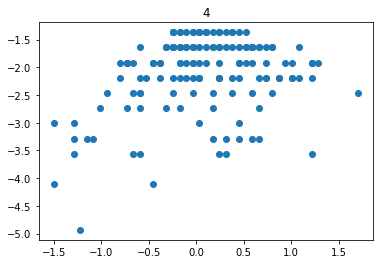

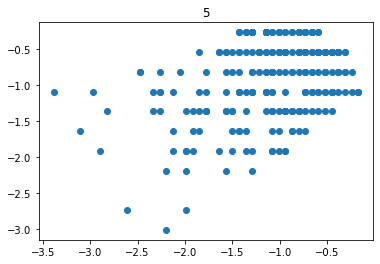

In [15]:

List=list(Name.loc[:,'name'])
for x in List:
    df2  = df1[x]
    kmeans = KMeans(n_clusters=score,n_init=score,random_state=2).fit(df2)
    centroids = kmeans.cluster_centers_
    cluster=kmeans.predict(df2)
    print(cluster)
    catagory[f'{x}']=cluster
    print(centroids)
    print('Attributes used for cluster model: ', x)
    plt.scatter(df2[x[0]], df2[x[1]], c= kmeans.labels_.astype(float))
    plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
    plt.show()
    for y in range(score):
        ind=np.where(cluster==y)
        plt.scatter(df2[x[0]].iloc[ind],df2[x[1]].iloc[ind])
        plt.title(y)
        plt.show()

In [16]:
catagory

,Index,Title,Artist,Top Genre,Year,"['Loudness (dB)', 'Energy']","['Valence', 'Danceability']","['Valence', 'Energy']","['Speechiness', 'Energy']","['Popularity', 'Loudness (dB)']"
0,1,Sunrise,Norah Jones,adult standards,2004,1,3,0,2,2
1,2,Black Night,Deep Purple,album rock,2000,3,3,2,3,5
2,3,Clint Eastwood,Gorillaz,alternative hip hop,2001,3,0,5,1,2
3,4,The Pretender,Foo Fighters,alternative metal,2007,5,4,4,3,3
4,5,Waitin' On A Sunny Day,Bruce Springsteen,classic rock,2002,5,3,2,3,1
...,...,...,...,...,...,...,...,...,...,...
1989,1990,Heartbreak Hotel,Elvis Presley,adult standards,1958,1,5,0,2,2
1990,1991,Hound Dog,Elvis Presley,adult standards,1958,0,1,2,3,3
1991,1992,Johnny B. Goode,Chuck Berry,blues rock,1959,3,3,2,3,2
1992,1993,Take Five,The Dave Brubeck Quartet,bebop,1959,1,1,0,2,2


#  Recommendation dummy
user=input('Enter the title or artist or genre: ')
print(catagory.iloc[:,1:4][(catagory['Title']==user)|(catagory['Artist']==user)|(catagory['Top Genre']==user)])
index=int(input('Enter the index'))
catagory.iloc[:,1:5][(catagory["['Loudness (dB)', 'Energy']"]==(catagory["['Loudness (dB)', 'Energy']"].iloc[index])) & (catagory["['Valence', 'Danceability']"]==(catagory["['Valence', 'Danceability']"].iloc[index])) & (catagory["['Valence', 'Energy']"]==(catagory["['Valence', 'Energy']"].loc[index])) & (catagory["['Speechiness', 'Energy']"]==(catagory["['Speechiness', 'Energy']"].loc[index])) & (catagory["['Popularity', 'Loudness (dB)']"]==(catagory["['Popularity', 'Loudness (dB)']"].loc[index]))]

In [17]:
catagory1=df.iloc[:,:5]
catagory1

,Index,Title,Artist,Top Genre,Year
0,1,Sunrise,Norah Jones,adult standards,2004
1,2,Black Night,Deep Purple,album rock,2000
2,3,Clint Eastwood,Gorillaz,alternative hip hop,2001
3,4,The Pretender,Foo Fighters,alternative metal,2007
4,5,Waitin' On A Sunny Day,Bruce Springsteen,classic rock,2002
...,...,...,...,...,...
1989,1990,Heartbreak Hotel,Elvis Presley,adult standards,1958
1990,1991,Hound Dog,Elvis Presley,adult standards,1958
1991,1992,Johnny B. Goode,Chuck Berry,blues rock,1959
1992,1993,Take Five,The Dave Brubeck Quartet,bebop,1959


from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=0.4, min_samples=2)
df3['clusterid'] = dbscan.fit_predict(df3[['Horsepower','Engine_size']])
y_pred=df3['clusterid']
k=df3['clusterid'].max()+1
outlier=np.sum(df3['clusterid']==-1)
print('k =',k,'outlier =',outlier)
plt.scatter(df3['Horsepower'], df3['Engine_size'],c=y_pred, cmap='Paired')
plt.title("DBSCAN: eps 0.4 : min_p 2")
plt.show()

n_clusters= 6 linkage = ['Popularity', 'Loudness (dB)']


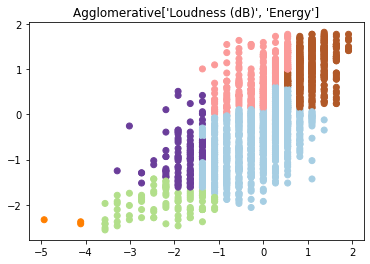

n_clusters= 6 linkage = ['Popularity', 'Loudness (dB)']


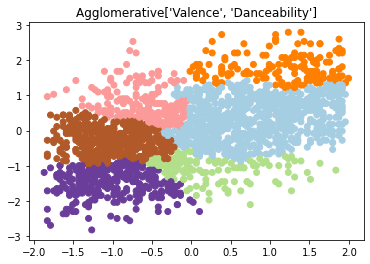

n_clusters= 6 linkage = ['Popularity', 'Loudness (dB)']


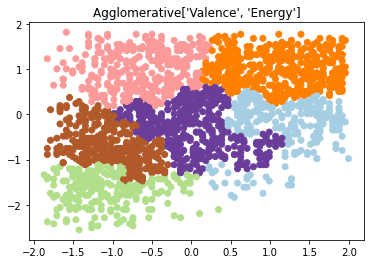

n_clusters= 6 linkage = ['Popularity', 'Loudness (dB)']


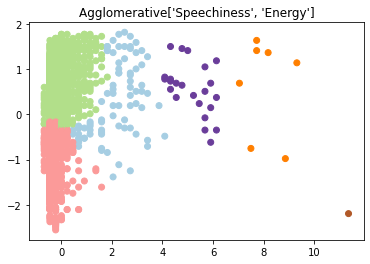

n_clusters= 6 linkage = ['Popularity', 'Loudness (dB)']


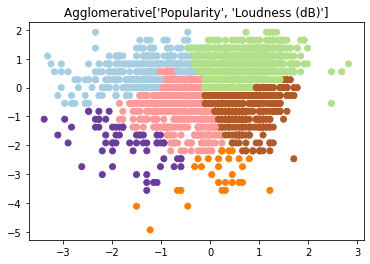

In [18]:
from sklearn.cluster import  AgglomerativeClustering
List1=list(Name.loc[:,'name'])
for z in List1:
    df3=df1[z]
    model = AgglomerativeClustering(n_clusters= score, linkage = 'complete')
    model = model.fit_predict(df3)
    catagory1[f'{z}']=model
    Model = model
    print('n_clusters=',score,'linkage =',x)
    plt.scatter(df3[z[0]], df3[z[1]],c=Model, cmap='Paired')
    plt.title(f"Agglomerative{z}")
    plt.show()

In [19]:
catagory1

,Index,Title,Artist,Top Genre,Year,"['Loudness (dB)', 'Energy']","['Valence', 'Danceability']","['Valence', 'Energy']","['Speechiness', 'Energy']","['Popularity', 'Loudness (dB)']"
0,1,Sunrise,Norah Jones,adult standards,2004,0,0,0,2,5
1,2,Black Night,Deep Purple,album rock,2000,2,0,3,1,2
2,3,Clint Eastwood,Gorillaz,alternative hip hop,2001,2,0,4,0,1
3,4,The Pretender,Foo Fighters,alternative metal,2007,5,5,2,1,1
4,5,Waitin' On A Sunny Day,Bruce Springsteen,classic rock,2002,5,0,3,1,1
...,...,...,...,...,...,...,...,...,...,...
1989,1990,Heartbreak Hotel,Elvis Presley,adult standards,1958,0,0,0,2,5
1990,1991,Hound Dog,Elvis Presley,adult standards,1958,2,1,3,1,1
1991,1992,Johnny B. Goode,Chuck Berry,blues rock,1959,2,0,3,1,5
1992,1993,Take Five,The Dave Brubeck Quartet,bebop,1959,0,0,0,2,5


In [20]:
recommend(catagory)

Enter the title or artist or genre: Fats Domino
               Title       Artist        Top Genre
1993  Blueberry Hill  Fats Domino  adult standards
Enter the index1993
                         Title         Artist          Top Genre  Year
1513  Love Rears Its Ugly Head  Living Colour  alternative metal  1990
1993            Blueberry Hill    Fats Domino    adult standards  1959


In [21]:
recommend(catagory1)


Enter the title or artist or genre: Fats Domino
               Title       Artist        Top Genre
1993  Blueberry Hill  Fats Domino  adult standards
Enter the index1993
                                                 Title                 Artist  \
35                                   The Eyes of Jenny            Sandy Coast   
61                                        Solitary Man            Johnny Cash   
87                                               Rosie         Claw Boys Claw   
231                            The Wall Street Shuffle                   10cc   
500                                            Flappie        Youp van 't Hek   
668                  Someone Somewhere (In Summertime)           Simple Minds   
873                                  Give Up Your Guns              The Buoys   
889                                   Time In A Bottle              Jim Croce   
901                                A Thing Called Love            Johnny Cash   
934              I'l

C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)
C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)
C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer]

k = 21 outlier = 1809 ['Loudness (dB)', 'Energy']


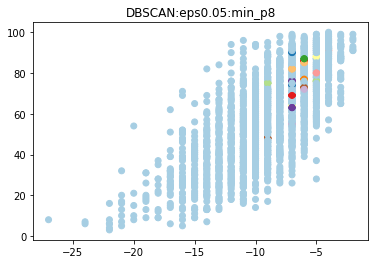

C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)


k = 11 outlier = 1889 ['Loudness (dB)', 'Energy']


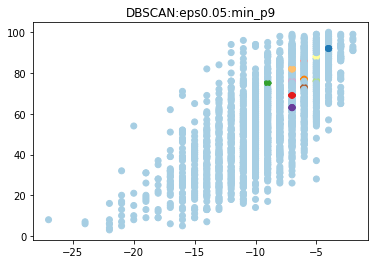

C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)
C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)
C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer]

k = 21 outlier = 1809 ['Loudness (dB)', 'Energy']


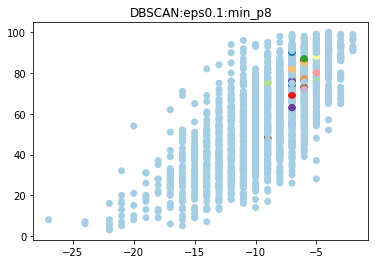

k = 11 outlier = 1889 ['Loudness (dB)', 'Energy']


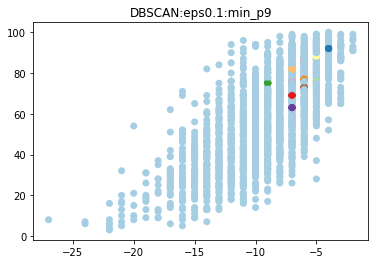

k = 21 outlier = 1809 ['Loudness (dB)', 'Energy']


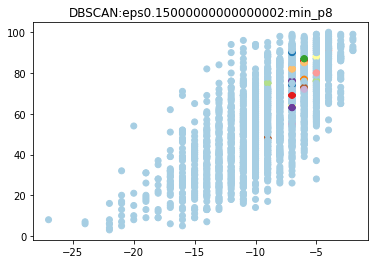

k = 11 outlier = 1889 ['Loudness (dB)', 'Energy']


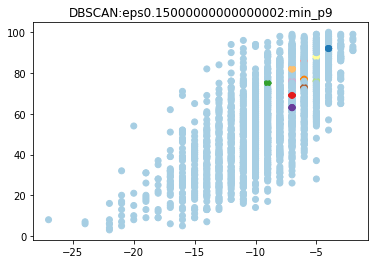

k = 21 outlier = 1809 ['Loudness (dB)', 'Energy']


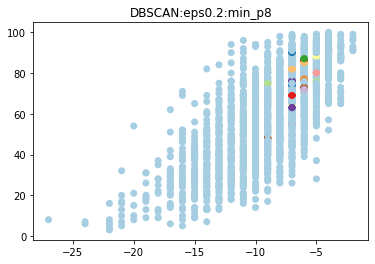

k = 11 outlier = 1889 ['Loudness (dB)', 'Energy']


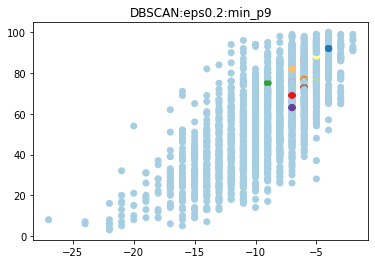

k = 21 outlier = 1809 ['Loudness (dB)', 'Energy']


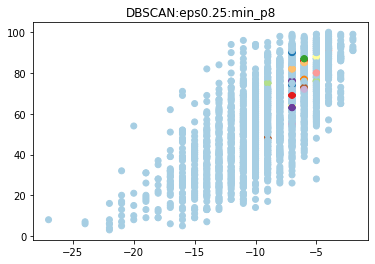

k = 11 outlier = 1889 ['Loudness (dB)', 'Energy']


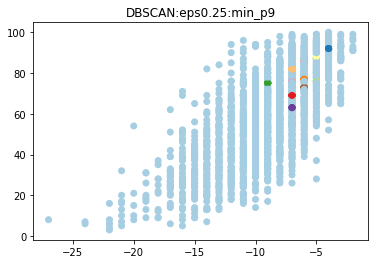

k = 21 outlier = 1809 ['Loudness (dB)', 'Energy']


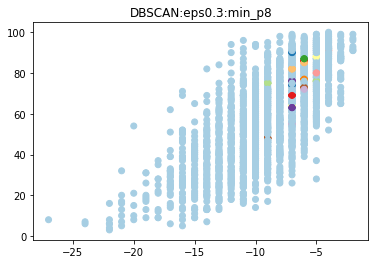

k = 11 outlier = 1889 ['Loudness (dB)', 'Energy']


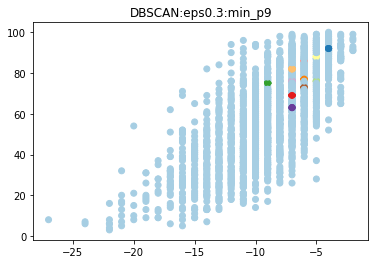

k = 21 outlier = 1809 ['Loudness (dB)', 'Energy']


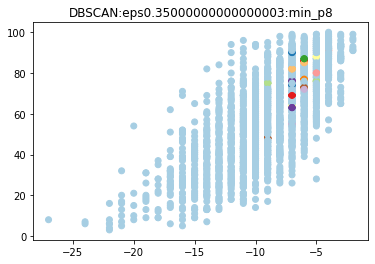

k = 11 outlier = 1889 ['Loudness (dB)', 'Energy']


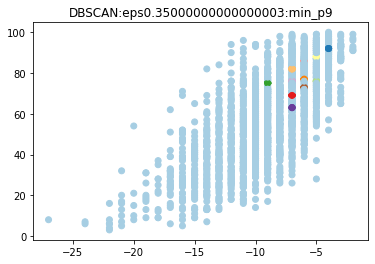

k = 21 outlier = 1809 ['Loudness (dB)', 'Energy']


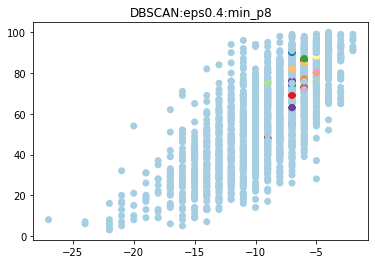

k = 11 outlier = 1889 ['Loudness (dB)', 'Energy']


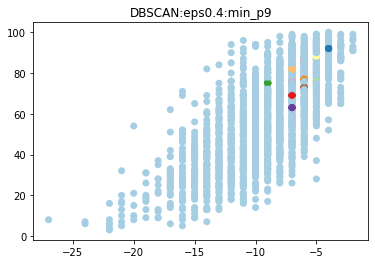

k = 21 outlier = 1809 ['Loudness (dB)', 'Energy']


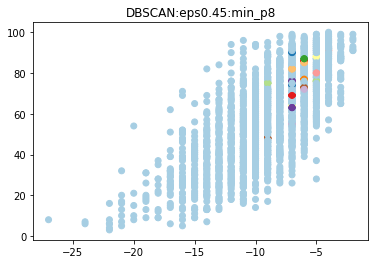

k = 11 outlier = 1889 ['Loudness (dB)', 'Energy']


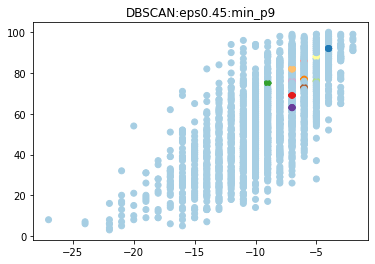

C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)
C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)
C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer]

k = 11 outlier = 1950 ['Valence', 'Danceability']


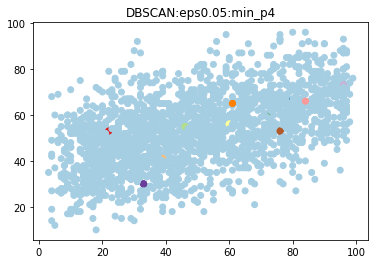

k = 0 outlier = 1994 ['Valence', 'Danceability']


C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)


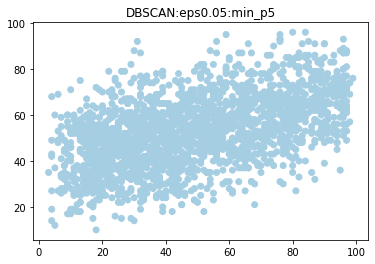

C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)


k = 0 outlier = 1994 ['Valence', 'Danceability']


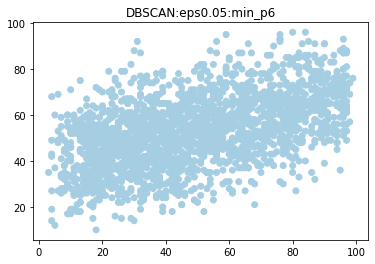

k = 0 outlier = 1994 ['Valence', 'Danceability']


C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)


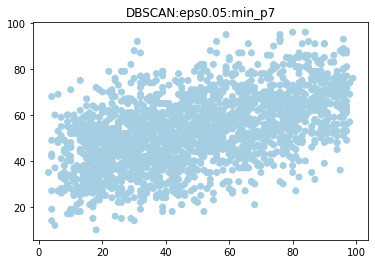

k = 0 outlier = 1994 ['Valence', 'Danceability']


C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)


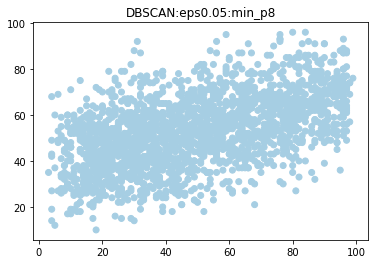

k = 0 outlier = 1994 ['Valence', 'Danceability']


C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)


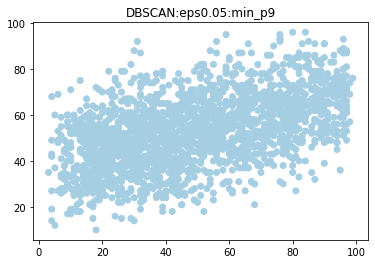

C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)
C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)
C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer]

k = 11 outlier = 1950 ['Valence', 'Danceability']


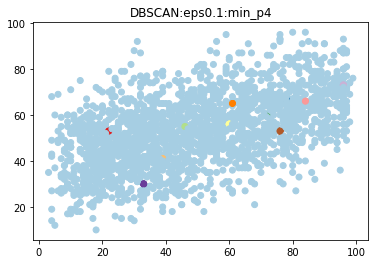

C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)


k = 0 outlier = 1994 ['Valence', 'Danceability']


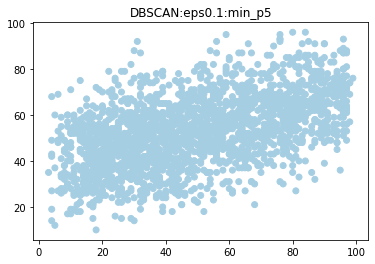

k = 0 outlier = 1994 ['Valence', 'Danceability']


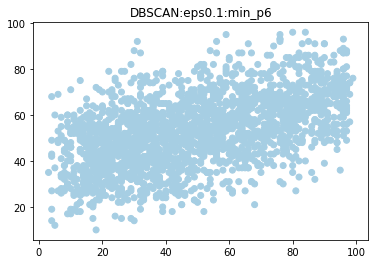

k = 0 outlier = 1994 ['Valence', 'Danceability']


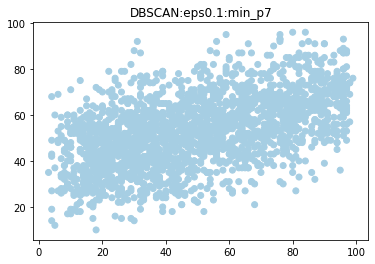

k = 0 outlier = 1994 ['Valence', 'Danceability']


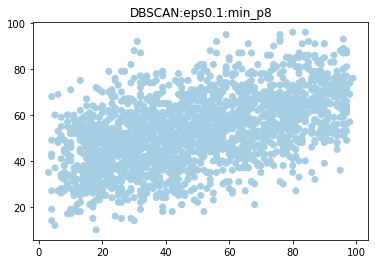

k = 0 outlier = 1994 ['Valence', 'Danceability']


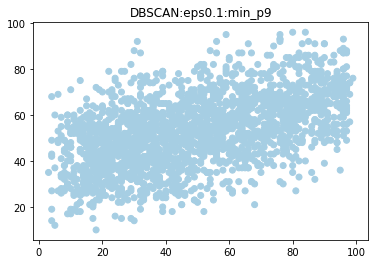

k = 11 outlier = 1950 ['Valence', 'Danceability']


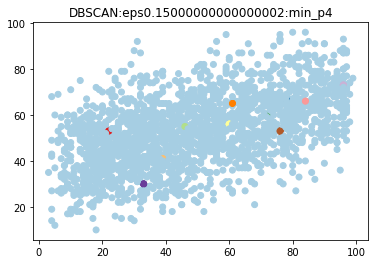

k = 0 outlier = 1994 ['Valence', 'Danceability']


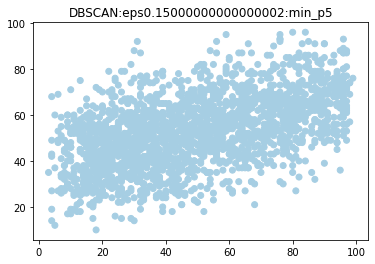

k = 0 outlier = 1994 ['Valence', 'Danceability']


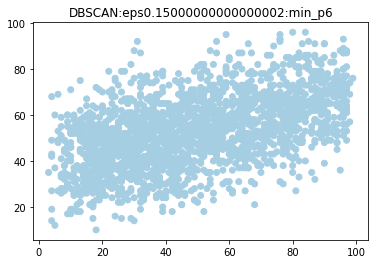

k = 0 outlier = 1994 ['Valence', 'Danceability']


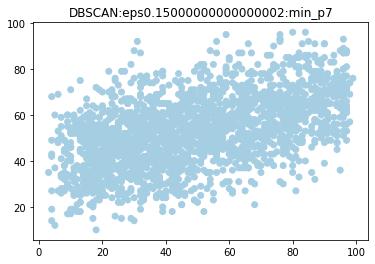

k = 0 outlier = 1994 ['Valence', 'Danceability']


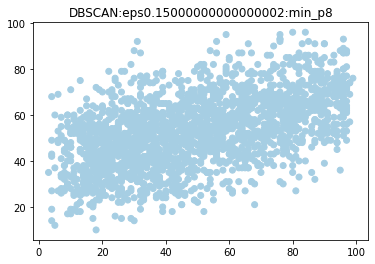

k = 0 outlier = 1994 ['Valence', 'Danceability']


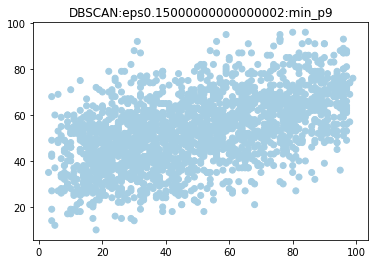

k = 11 outlier = 1950 ['Valence', 'Danceability']


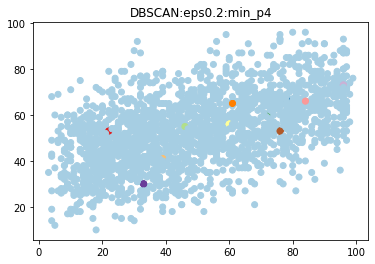

k = 0 outlier = 1994 ['Valence', 'Danceability']


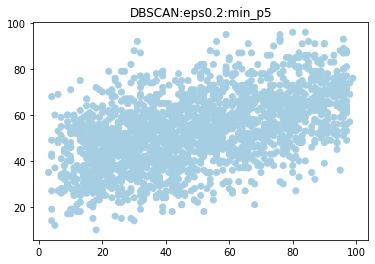

k = 0 outlier = 1994 ['Valence', 'Danceability']


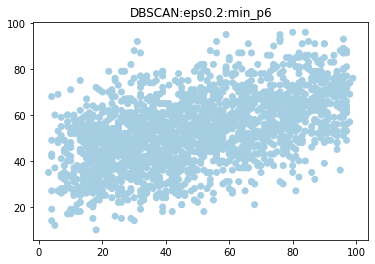

k = 0 outlier = 1994 ['Valence', 'Danceability']


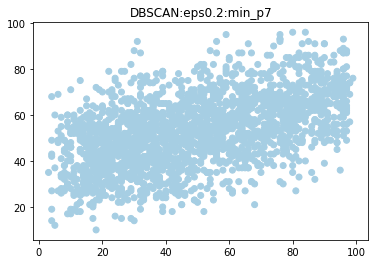

k = 0 outlier = 1994 ['Valence', 'Danceability']


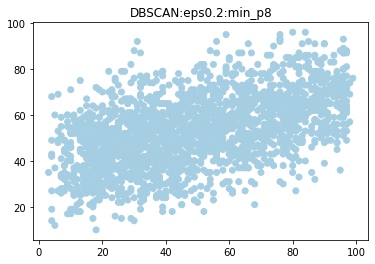

k = 0 outlier = 1994 ['Valence', 'Danceability']


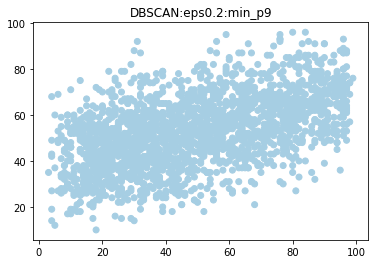

k = 11 outlier = 1950 ['Valence', 'Danceability']


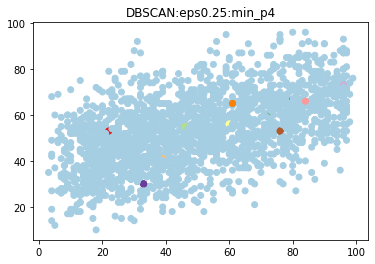

k = 0 outlier = 1994 ['Valence', 'Danceability']


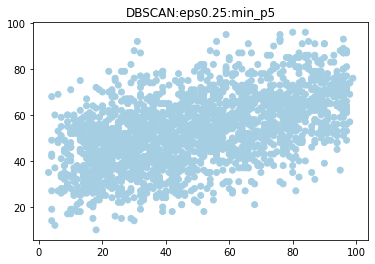

k = 0 outlier = 1994 ['Valence', 'Danceability']


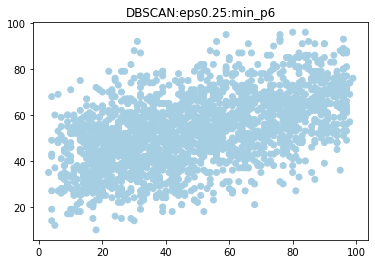

k = 0 outlier = 1994 ['Valence', 'Danceability']


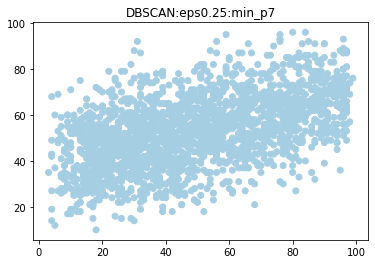

k = 0 outlier = 1994 ['Valence', 'Danceability']


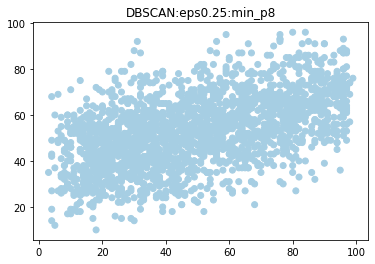

k = 0 outlier = 1994 ['Valence', 'Danceability']


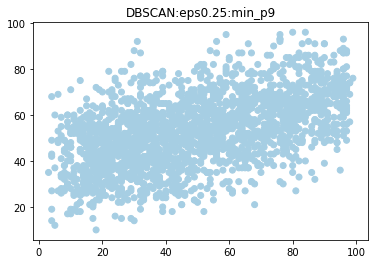

k = 11 outlier = 1950 ['Valence', 'Danceability']


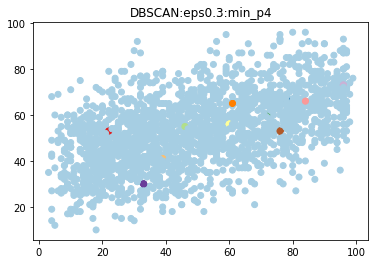

k = 0 outlier = 1994 ['Valence', 'Danceability']


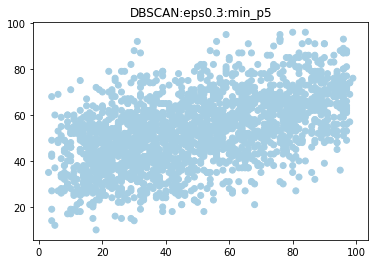

k = 0 outlier = 1994 ['Valence', 'Danceability']


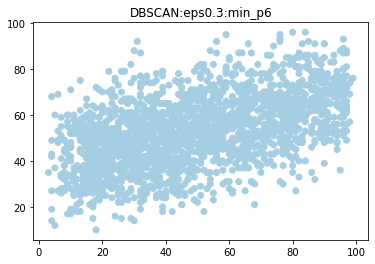

k = 0 outlier = 1994 ['Valence', 'Danceability']


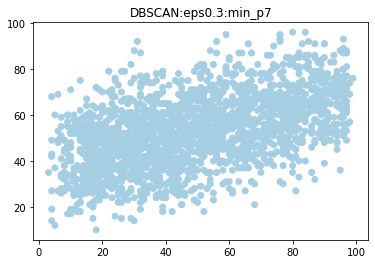

k = 0 outlier = 1994 ['Valence', 'Danceability']


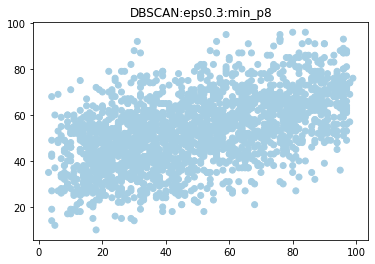

k = 0 outlier = 1994 ['Valence', 'Danceability']


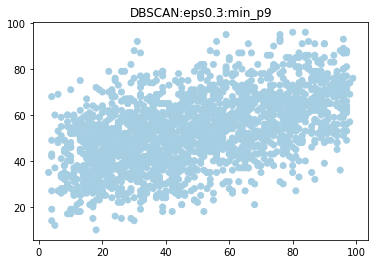

k = 11 outlier = 1950 ['Valence', 'Danceability']


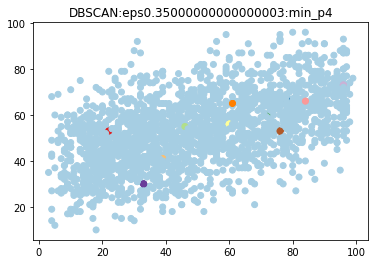

k = 0 outlier = 1994 ['Valence', 'Danceability']


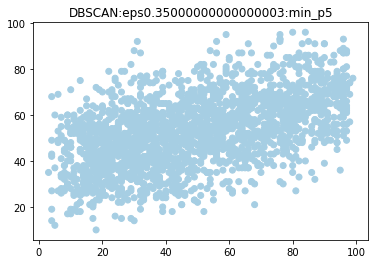

k = 0 outlier = 1994 ['Valence', 'Danceability']


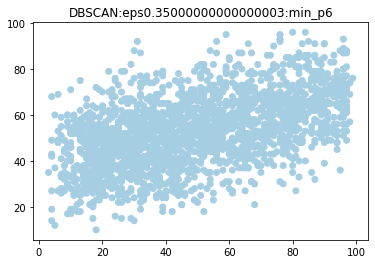

k = 0 outlier = 1994 ['Valence', 'Danceability']


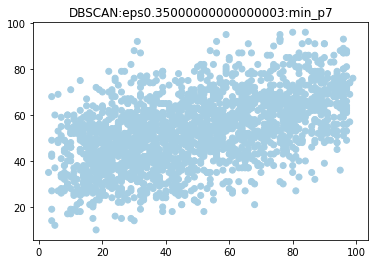

k = 0 outlier = 1994 ['Valence', 'Danceability']


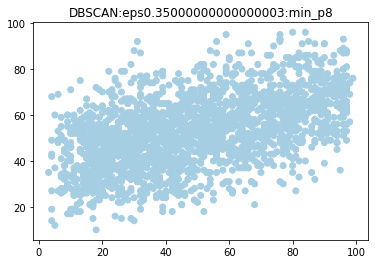

k = 0 outlier = 1994 ['Valence', 'Danceability']


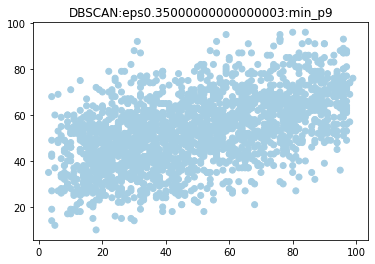

k = 11 outlier = 1950 ['Valence', 'Danceability']


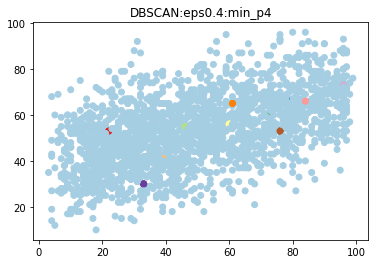

k = 0 outlier = 1994 ['Valence', 'Danceability']


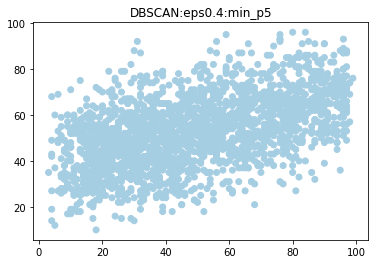

k = 0 outlier = 1994 ['Valence', 'Danceability']


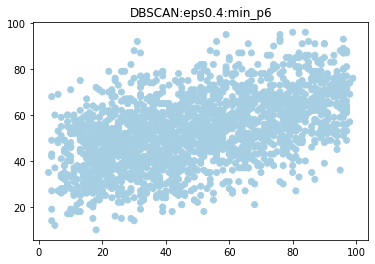

k = 0 outlier = 1994 ['Valence', 'Danceability']


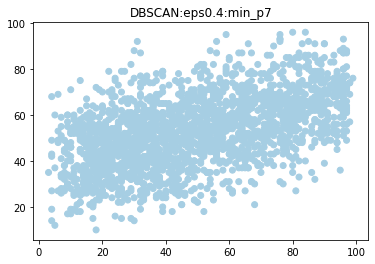

k = 0 outlier = 1994 ['Valence', 'Danceability']


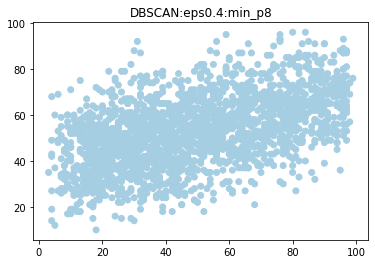

k = 0 outlier = 1994 ['Valence', 'Danceability']


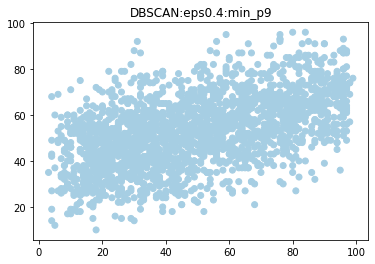

k = 11 outlier = 1950 ['Valence', 'Danceability']


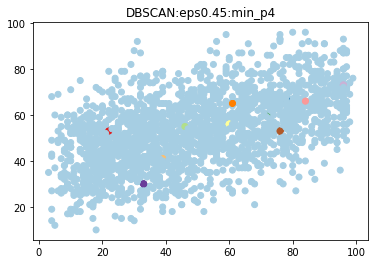

k = 0 outlier = 1994 ['Valence', 'Danceability']


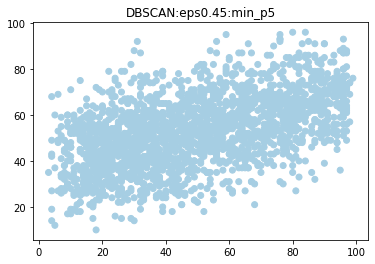

k = 0 outlier = 1994 ['Valence', 'Danceability']


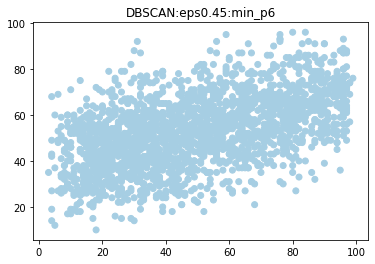

k = 0 outlier = 1994 ['Valence', 'Danceability']


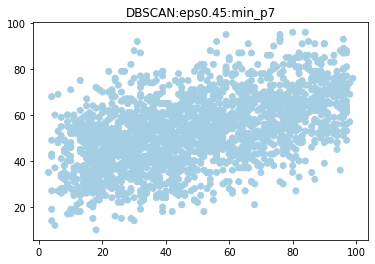

k = 0 outlier = 1994 ['Valence', 'Danceability']


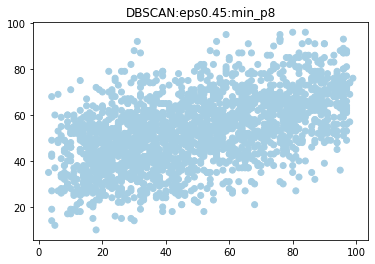

k = 0 outlier = 1994 ['Valence', 'Danceability']


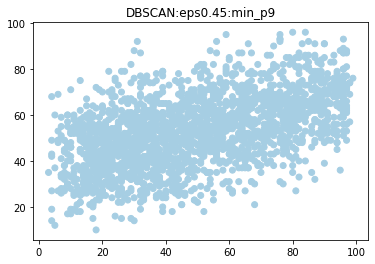

C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)
C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)


k = 32 outlier = 1894 ['Valence', 'Energy']


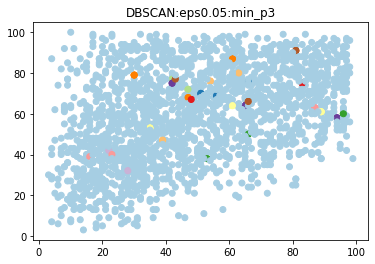

k = 4 outlier = 1978 ['Valence', 'Energy']


C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)


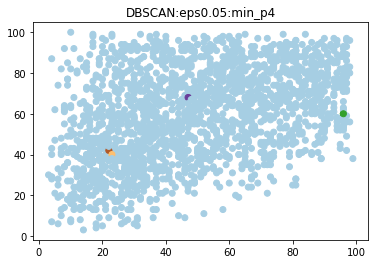

k = 0 outlier = 1994 ['Valence', 'Energy']


C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)


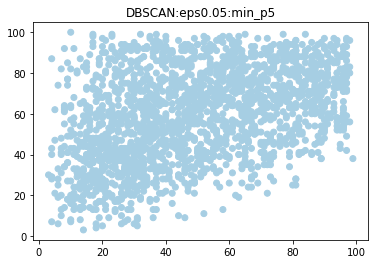

k = 0 outlier = 1994 ['Valence', 'Energy']


C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)


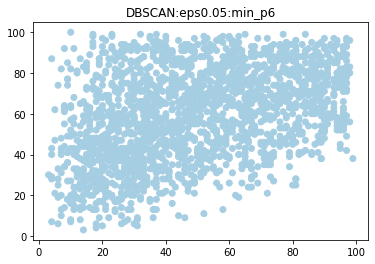

C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)


k = 0 outlier = 1994 ['Valence', 'Energy']


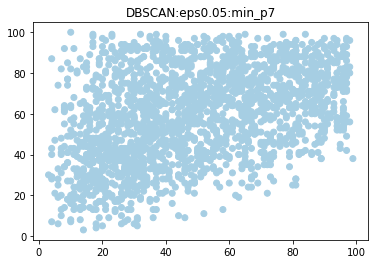

k = 0 outlier = 1994 ['Valence', 'Energy']


C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)


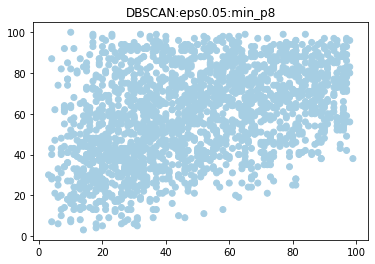

k = 0 outlier = 1994 ['Valence', 'Energy']


C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)


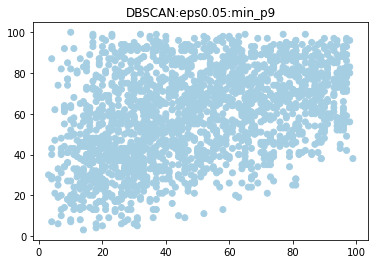

C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)
C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)


k = 32 outlier = 1894 ['Valence', 'Energy']


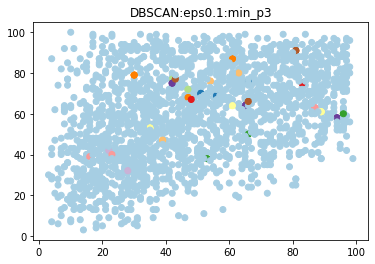

C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)


k = 4 outlier = 1978 ['Valence', 'Energy']


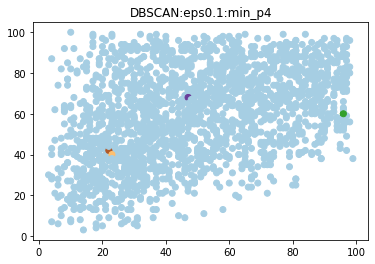

k = 0 outlier = 1994 ['Valence', 'Energy']


C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)


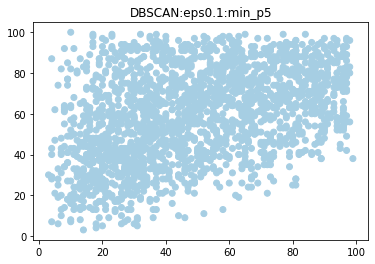

k = 0 outlier = 1994 ['Valence', 'Energy']


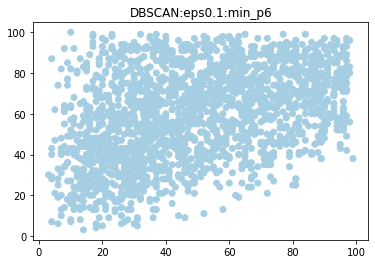

k = 0 outlier = 1994 ['Valence', 'Energy']


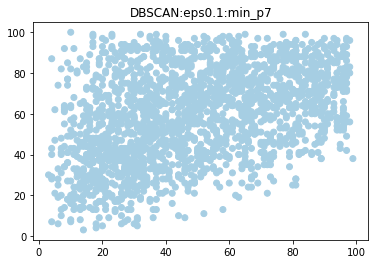

k = 0 outlier = 1994 ['Valence', 'Energy']


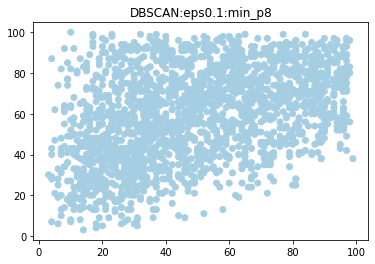

k = 0 outlier = 1994 ['Valence', 'Energy']


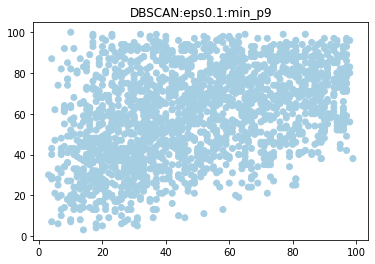

k = 32 outlier = 1894 ['Valence', 'Energy']


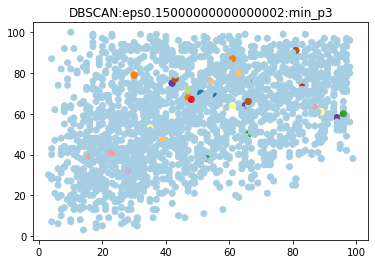

k = 4 outlier = 1978 ['Valence', 'Energy']


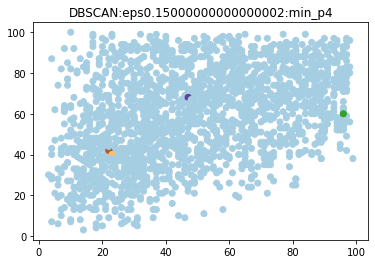

k = 0 outlier = 1994 ['Valence', 'Energy']


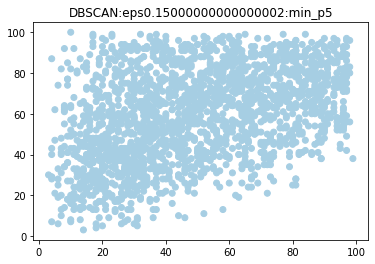

k = 0 outlier = 1994 ['Valence', 'Energy']


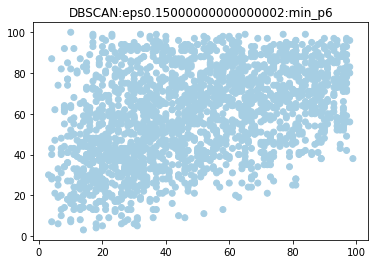

k = 0 outlier = 1994 ['Valence', 'Energy']


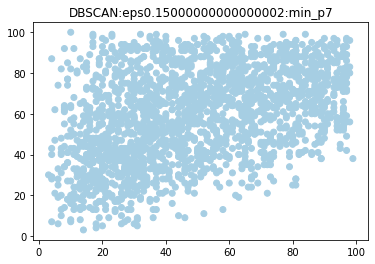

k = 0 outlier = 1994 ['Valence', 'Energy']


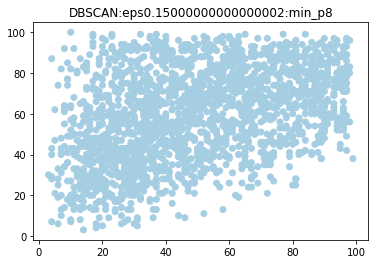

k = 0 outlier = 1994 ['Valence', 'Energy']


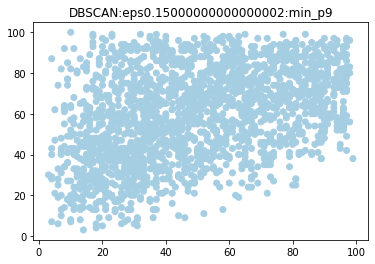

k = 32 outlier = 1894 ['Valence', 'Energy']


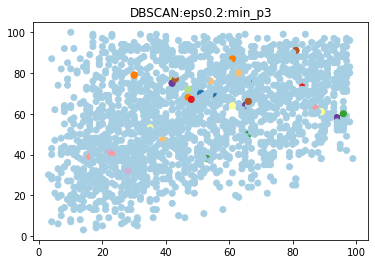

k = 4 outlier = 1978 ['Valence', 'Energy']


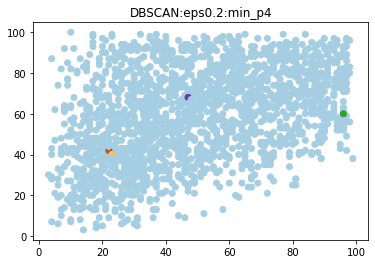

k = 0 outlier = 1994 ['Valence', 'Energy']


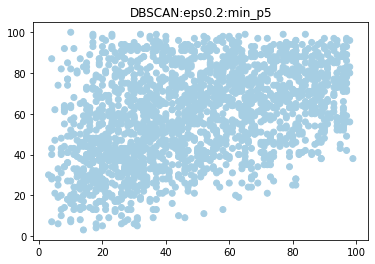

k = 0 outlier = 1994 ['Valence', 'Energy']


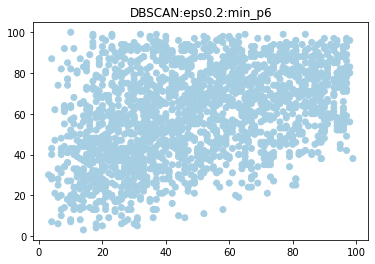

k = 0 outlier = 1994 ['Valence', 'Energy']


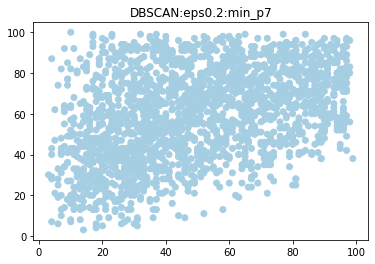

k = 0 outlier = 1994 ['Valence', 'Energy']


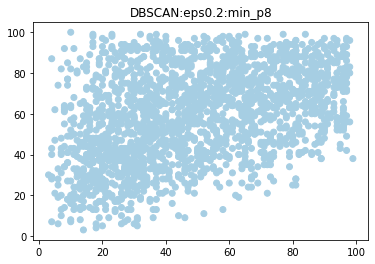

k = 0 outlier = 1994 ['Valence', 'Energy']


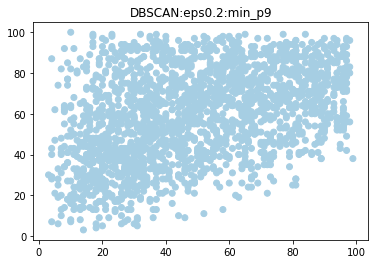

k = 32 outlier = 1894 ['Valence', 'Energy']


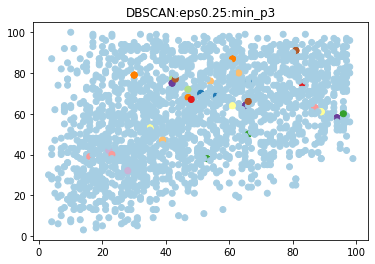

k = 4 outlier = 1978 ['Valence', 'Energy']


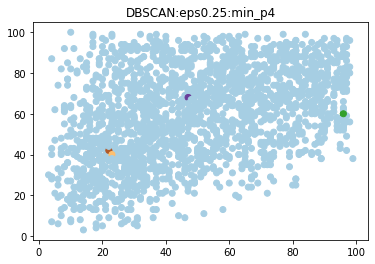

k = 0 outlier = 1994 ['Valence', 'Energy']


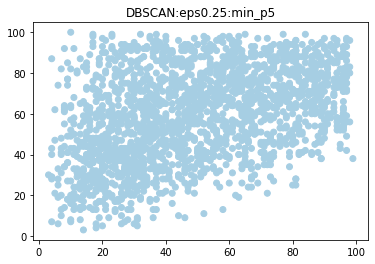

k = 0 outlier = 1994 ['Valence', 'Energy']


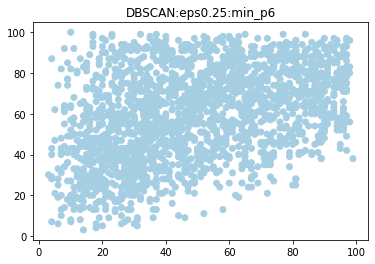

k = 0 outlier = 1994 ['Valence', 'Energy']


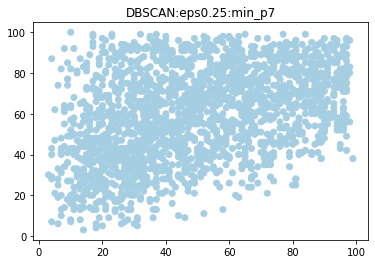

k = 0 outlier = 1994 ['Valence', 'Energy']


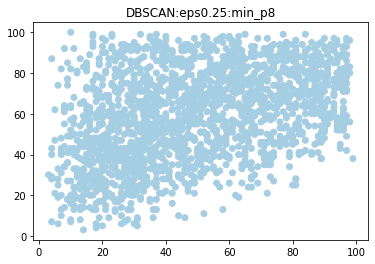

k = 0 outlier = 1994 ['Valence', 'Energy']


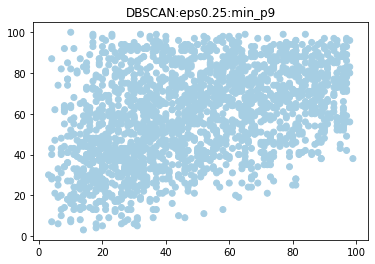

k = 32 outlier = 1894 ['Valence', 'Energy']


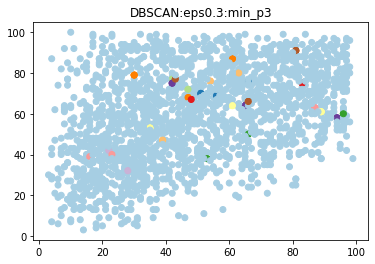

k = 4 outlier = 1978 ['Valence', 'Energy']


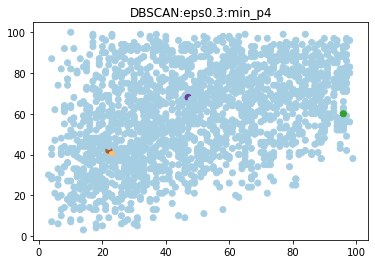

k = 0 outlier = 1994 ['Valence', 'Energy']


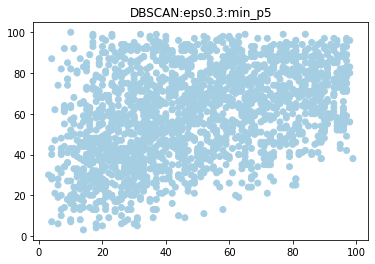

k = 0 outlier = 1994 ['Valence', 'Energy']


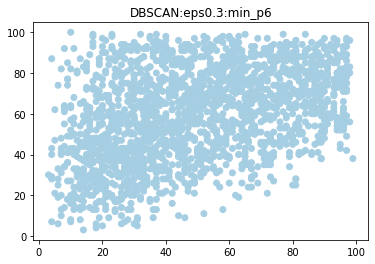

k = 0 outlier = 1994 ['Valence', 'Energy']


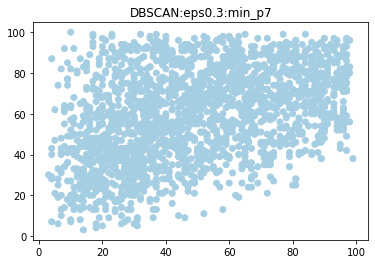

k = 0 outlier = 1994 ['Valence', 'Energy']


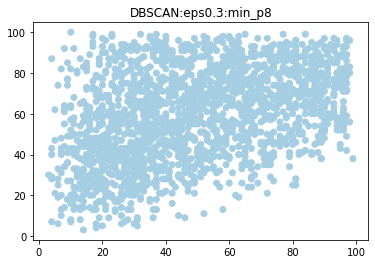

k = 0 outlier = 1994 ['Valence', 'Energy']


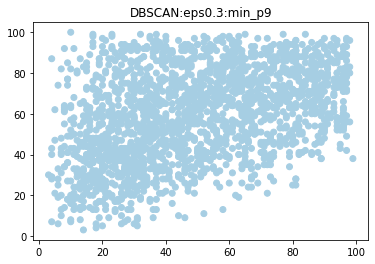

k = 32 outlier = 1894 ['Valence', 'Energy']


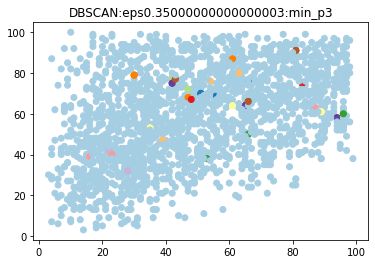

k = 4 outlier = 1978 ['Valence', 'Energy']


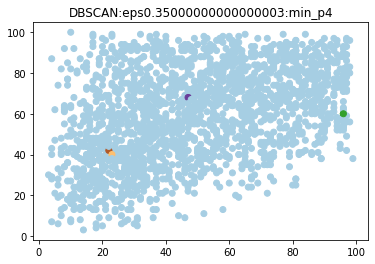

k = 0 outlier = 1994 ['Valence', 'Energy']


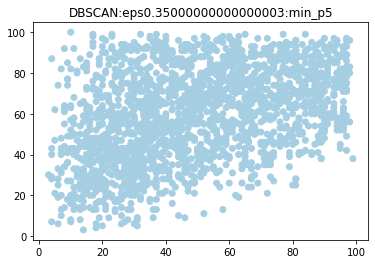

k = 0 outlier = 1994 ['Valence', 'Energy']


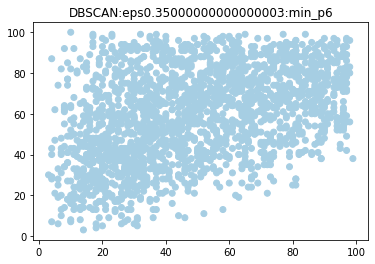

k = 0 outlier = 1994 ['Valence', 'Energy']


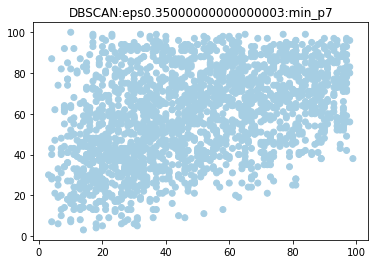

k = 0 outlier = 1994 ['Valence', 'Energy']


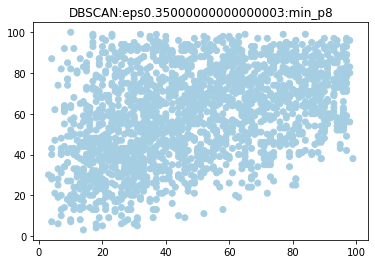

k = 0 outlier = 1994 ['Valence', 'Energy']


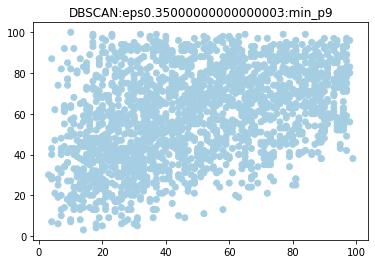

k = 32 outlier = 1894 ['Valence', 'Energy']


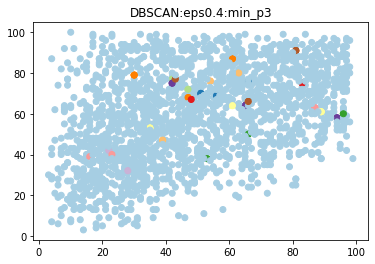

k = 4 outlier = 1978 ['Valence', 'Energy']


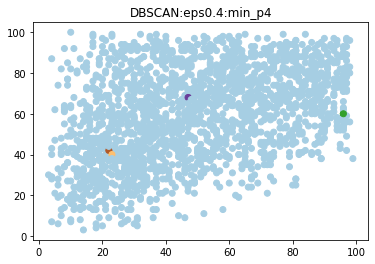

k = 0 outlier = 1994 ['Valence', 'Energy']


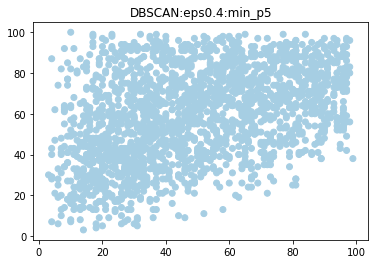

k = 0 outlier = 1994 ['Valence', 'Energy']


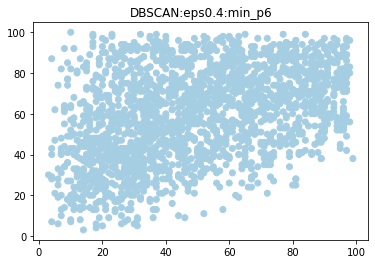

k = 0 outlier = 1994 ['Valence', 'Energy']


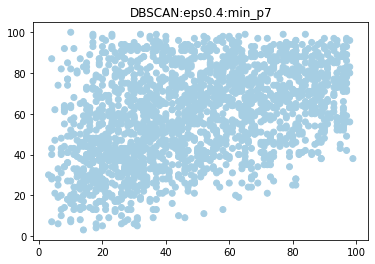

k = 0 outlier = 1994 ['Valence', 'Energy']


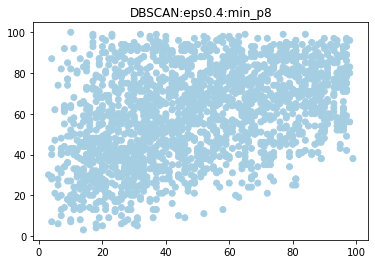

k = 0 outlier = 1994 ['Valence', 'Energy']


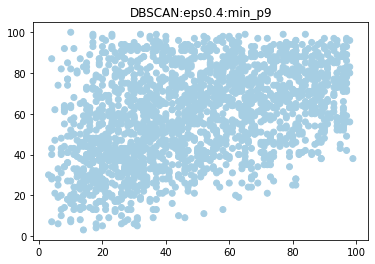

k = 32 outlier = 1894 ['Valence', 'Energy']


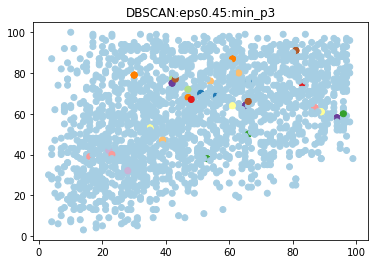

k = 4 outlier = 1978 ['Valence', 'Energy']


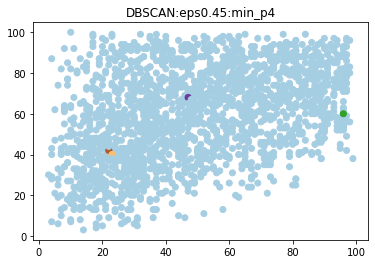

k = 0 outlier = 1994 ['Valence', 'Energy']


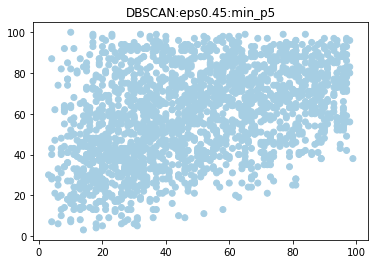

k = 0 outlier = 1994 ['Valence', 'Energy']


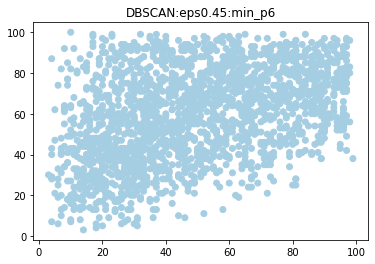

k = 0 outlier = 1994 ['Valence', 'Energy']


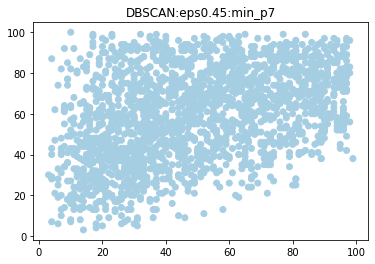

k = 0 outlier = 1994 ['Valence', 'Energy']


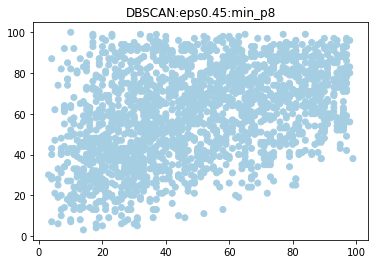

k = 0 outlier = 1994 ['Valence', 'Energy']


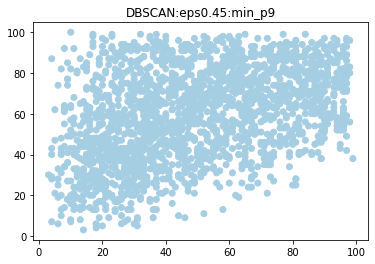

C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)
C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)
C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer]

k = 25 outlier = 1763 ['Popularity', 'Loudness (dB)']


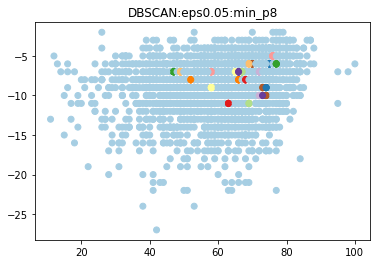

k = 14 outlier = 1851 ['Popularity', 'Loudness (dB)']


C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)


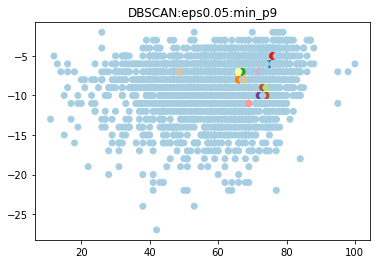

C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)
C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)
C:\Users\krish\AppData\Local\Temp\ipykernel_11364\3369515460.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer]

k = 25 outlier = 1763 ['Popularity', 'Loudness (dB)']


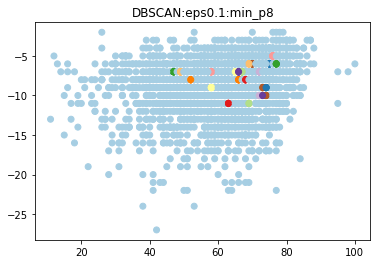

k = 14 outlier = 1851 ['Popularity', 'Loudness (dB)']


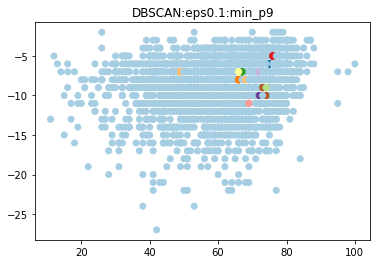

k = 25 outlier = 1763 ['Popularity', 'Loudness (dB)']


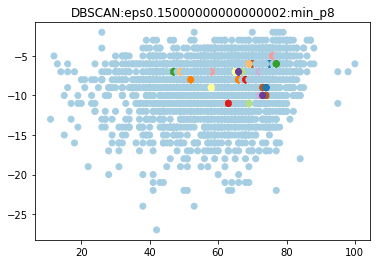

k = 14 outlier = 1851 ['Popularity', 'Loudness (dB)']


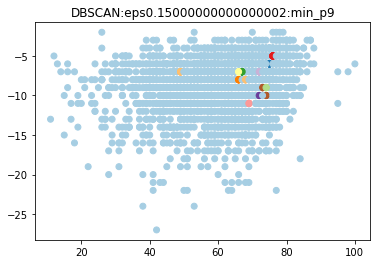

k = 25 outlier = 1763 ['Popularity', 'Loudness (dB)']


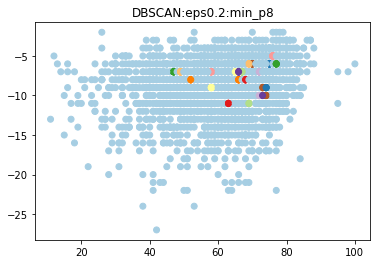

k = 14 outlier = 1851 ['Popularity', 'Loudness (dB)']


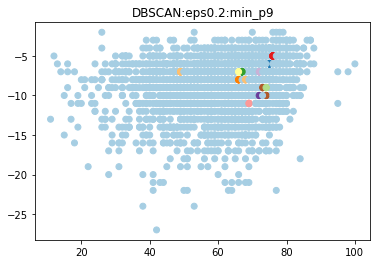

k = 25 outlier = 1763 ['Popularity', 'Loudness (dB)']


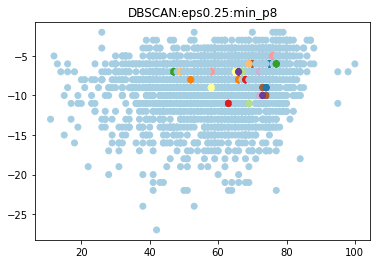

k = 14 outlier = 1851 ['Popularity', 'Loudness (dB)']


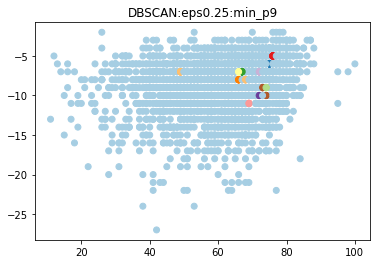

k = 25 outlier = 1763 ['Popularity', 'Loudness (dB)']


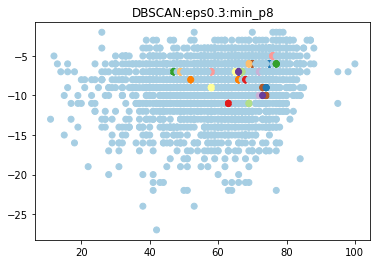

k = 14 outlier = 1851 ['Popularity', 'Loudness (dB)']


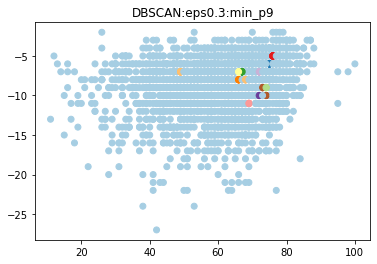

k = 25 outlier = 1763 ['Popularity', 'Loudness (dB)']


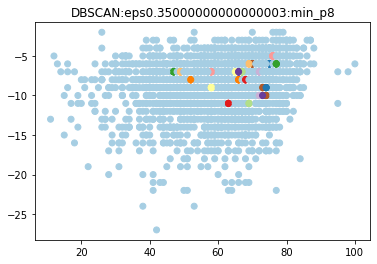

k = 14 outlier = 1851 ['Popularity', 'Loudness (dB)']


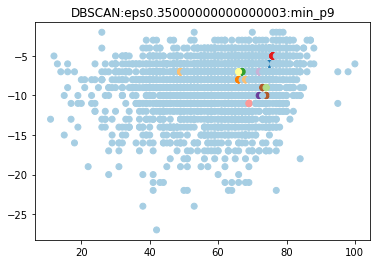

k = 25 outlier = 1763 ['Popularity', 'Loudness (dB)']


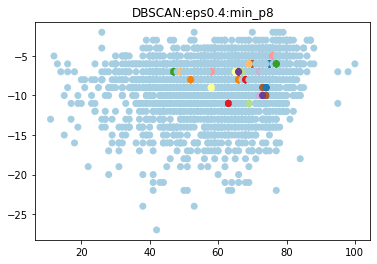

k = 14 outlier = 1851 ['Popularity', 'Loudness (dB)']


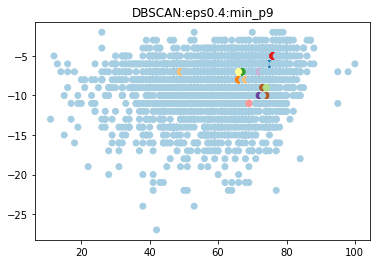

k = 25 outlier = 1763 ['Popularity', 'Loudness (dB)']


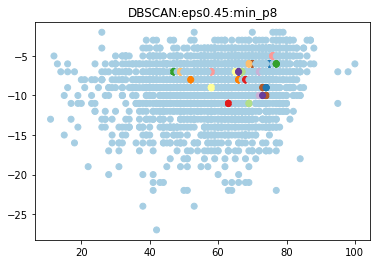

k = 14 outlier = 1851 ['Popularity', 'Loudness (dB)']


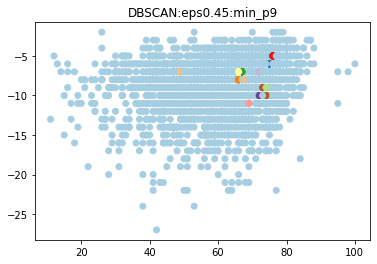

In [24]:
from sklearn.cluster import DBSCAN
for z in List1:
    df4=df[z]
    for x in np.arange(0.05,0.5,0.05):
        for y in range(2,10):
            dbscan = DBSCAN(eps=x, min_samples=y)
            df4[f'{z}{x}{y}'] = dbscan.fit_predict(df4)
            y_pred=df4[f'{z}{x}{y}']
            k=df4[f'{z}{x}{y}'].max()+1
            outlier=np.sum(df4[f'{z}{x}{y}']==-1)
            if k < 40:
                print('k =',k,'outlier =',outlier, z)
                plt.scatter(df4[z[0]], df4[z[1]],c = y_pred, cmap='Paired')
                plt.title(f"DBSCAN:eps{x}:min_p{y}")
                plt.show()

In [23]:
df4

,Popularity,Loudness (dB),"['Popularity', 'Loudness (dB)']0.052","['Popularity', 'Loudness (dB)']0.053","['Popularity', 'Loudness (dB)']0.054","['Popularity', 'Loudness (dB)']0.055","['Popularity', 'Loudness (dB)']0.056","['Popularity', 'Loudness (dB)']0.057","['Popularity', 'Loudness (dB)']0.058","['Popularity', 'Loudness (dB)']0.059",...,"['Popularity', 'Loudness (dB)']0.48","['Popularity', 'Loudness (dB)']0.49","['Popularity', 'Loudness (dB)']0.452","['Popularity', 'Loudness (dB)']0.453","['Popularity', 'Loudness (dB)']0.454","['Popularity', 'Loudness (dB)']0.455","['Popularity', 'Loudness (dB)']0.456","['Popularity', 'Loudness (dB)']0.457","['Popularity', 'Loudness (dB)']0.458","['Popularity', 'Loudness (dB)']0.459"
0,71,-14,0,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,0,-1,-1,-1,-1,-1,-1,-1
1,39,-11,1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,1,-1,-1,-1,-1,-1,-1,-1
2,69,-9,2,0,0,0,0,0,0,0,...,0,0,2,0,0,0,0,0,0,0
3,76,-4,3,1,1,1,-1,-1,-1,-1,...,-1,-1,3,1,1,1,-1,-1,-1,-1
4,59,-5,4,2,2,2,-1,-1,-1,-1,...,-1,-1,4,2,2,2,-1,-1,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,63,-12,288,223,-1,-1,-1,-1,-1,-1,...,-1,-1,288,223,-1,-1,-1,-1,-1,-1
1990,69,-8,316,236,178,123,69,45,-1,-1,...,-1,-1,316,236,178,123,69,45,-1,-1
1991,74,-9,36,31,22,11,7,4,3,2,...,3,2,36,31,22,11,7,4,3,2
1992,65,-13,355,261,196,132,71,-1,-1,-1,...,-1,-1,355,261,196,132,71,-1,-1,-1


the best performing recomendation model is Kmean . Because the Kmean is best suited as per the engine functionality. where Hierarchical is also functional with tha same engine but there are number of methord available.DBSCAN is not so good perofming as we are not having control over the cluster number.